In [1]:
from pathlib import Path
import matplotlib.image as mpimg
import matplotlib.pyplot as plt
import cv2
import numpy as np
import pandas as pd

In [2]:
df_dir = 'dataset/'

In [3]:
def load_dataset(img_dir):
    p = Path(img_dir)
    dirs = p.glob('*')

    img_list = []

    for dir in dirs:
        label = dir.name
        for file in dir.glob('*.jpg'):
            img = mpimg.imread(file)

            if not img is None:
                img_list.append((img, label))
    
    return img_list

In [4]:
df = load_dataset(df_dir)

In [5]:
import matplotlib.pyplot as plt

def img_viz(img_list, num_img):
    if num_img < 0 or num_img >= len(img_list):
        raise IndexError("num_img out of range")
    
    img, label = img_list[num_img]

    img = np.array(img)

    cmap = "gray" if len(img.shape) == 2 else None

    plt.figure(figsize=(4,4))
    plt.imshow(img, cmap=cmap)
    plt.title(f"Label: {label}")
    plt.axis("off")
    plt.show()

    print(f"Shape\t: {img.shape}")
    print(f"Label\t: {label}")


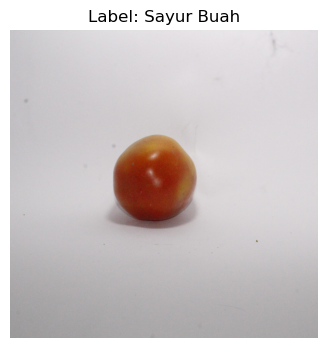

Shape	: (3456, 3456, 3)
Label	: Sayur Buah


In [6]:
img_viz(df, 40)

In [7]:
def crop_center(img, ratio=0.8):
    h, w = img.shape[:2]
    ch, cw = int(h * ratio), int(w * ratio)
    y1 = (h - ch) // 2
    x1 = (w - cw) // 2
    return img[y1:y1+ch, x1:x1+cw]

In [8]:
def apply_clahe(img):
    lab = cv2.cvtColor(img, cv2.COLOR_BGR2LAB)
    l, a, b = cv2.split(lab)

    clahe = cv2.createCLAHE(clipLimit=1.2, tileGridSize=(8,8))
    cl = clahe.apply(l)

    limg = cv2.merge((cl, a, b))
    return cv2.cvtColor(limg, cv2.COLOR_LAB2RGB)

In [9]:
def segment_object_otsu(img):
    gry = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

    _, img_thresh = cv2.threshold(
        gry, 0, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU
    )

    kernel = np.ones((3,3), np.uint8)
    img_thresh_open = cv2.morphologyEx(img_thresh, cv2.MORPH_OPEN, kernel)

    img_thresh_inv = cv2.bitwise_not(img_thresh_open)
    img_thresh_final = cv2.erode(img_thresh_inv, kernel, iterations=1)

    mask3 = np.repeat((img_thresh_final // 255)[..., None], 3, axis=2).astype("uint8")

    masked_bgr = img * mask3
    
    masked_rgb = cv2.cvtColor(masked_bgr, cv2.COLOR_BGR2RGB)
    
    return masked_rgb


In [10]:
def preprocessing_basic(img_list):
    result = []
    for img, label in img_list:
        
        cropped = crop_center(img)
        resized = cv2.resize(cropped, (224, 224))
        clahe = apply_clahe(resized)
        #seg_mask = segment_object_otsu(clahe)   

        # final_img = clahe * (seg_mask > 0)

        result.append((clahe, label))
    
    return result


In [11]:
basic = preprocessing_basic(df)

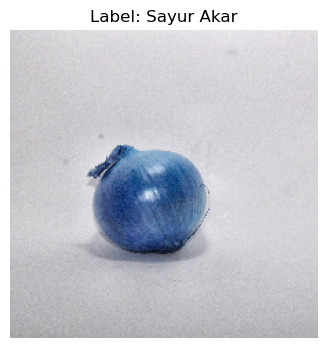

Shape	: (224, 224, 3)
Label	: Sayur Akar


In [12]:
img_viz(basic, 0)

In [13]:
def augment_img_deterministic(img):
    out = []

    out.append(img.copy())

    out.append(cv2.flip(img, 1))

    out.append(cv2.flip(img, 0))

    out.append(cv2.convertScaleAbs(img, alpha=1.2, beta=10))

    out.append(cv2.convertScaleAbs(img, alpha=0.8, beta=-10))

    h, w = img.shape[:2]
    M1 = cv2.getRotationMatrix2D((w//2, h//2), 15, 1)
    out.append(cv2.warpAffine(img, M1, (w, h)))

    M2 = cv2.getRotationMatrix2D((w//2, h//2), -15, 1)
    out.append(cv2.warpAffine(img, M2, (w, h)))

    M3 = cv2.getAffineTransform(
        np.float32([[0, 0], [w, 0], [0, h]]),
        np.float32([[0, 0], [w*1.5, 0], [0, h*1.5]])
    )
    zoomed = cv2.warpAffine(img, M3, (w, h))
    out.append(zoomed)

    return out        

In [14]:
def apply_augmentation(processed_list):
    augmented = []
    for img, label in processed_list:
        augs = augment_img_deterministic(img)
        for aug_img in augs:
            augmented.append((aug_img, label))
    return augmented


In [15]:
aug = apply_augmentation(basic)

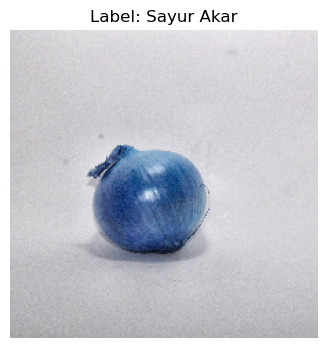

Shape	: (224, 224, 3)
Label	: Sayur Akar


In [16]:
img_viz(aug, 0)

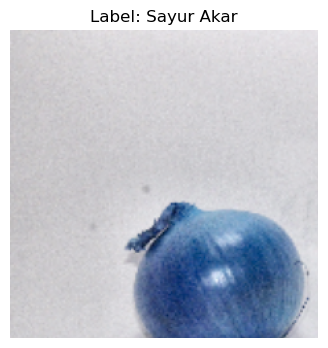

Shape	: (224, 224, 3)
Label	: Sayur Akar


In [17]:
img_viz(aug, 7)

In [18]:
def preprocess_for_HOG(processed_list):
    result = []
    for img, label in processed_list:
        grey = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
        blurred = cv2.GaussianBlur(grey, (3,3), 0)
        result.append((blurred, label))
    return result

In [19]:
hog_img = preprocess_for_HOG(aug)

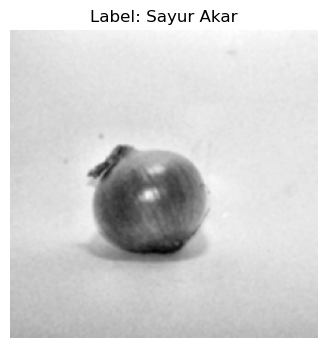

Shape	: (224, 224)
Label	: Sayur Akar


In [20]:
img_viz(hog_img, 0)

In [21]:
def preprocess_for_HSV(processed_list):
    result = []
    for img, label in processed_list:
        hsv = cv2.cvtColor(img, cv2.COLOR_BGR2HSV)
        result.append((hsv, label))
    return result

In [35]:
hsv_img = preprocess_for_HSV(aug)

In [23]:
hsv_img

[(array([[[162,   6, 211],
          [150,   7, 209],
          [158,   5, 205],
          ...,
          [156,   6, 227],
          [162,   6, 230],
          [162,   6, 230]],
  
         [[165,   3, 197],
          [160,   4, 205],
          [160,   4, 205],
          ...,
          [162,   5, 232],
          [156,   6, 227],
          [156,   6, 225]],
  
         [[143,   5, 210],
          [130,   4, 204],
          [150,   3, 203],
          ...,
          [156,   6, 225],
          [135,   7, 226],
          [150,   7, 223]],
  
         ...,
  
         [[170,  10, 160],
          [170,   9, 165],
          [160,   4, 179],
          ...,
          [170,   9, 178],
          [  0,   5, 187],
          [ 15,   3, 172]],
  
         [[  0,   6, 164],
          [ 15,   3, 170],
          [ 10,   5, 162],
          ...,
          [173,   5, 191],
          [173,   6, 178],
          [165,   3, 183]],
  
         [[  0,   0, 177],
          [  0,   0, 160],
          [150,   3, 172

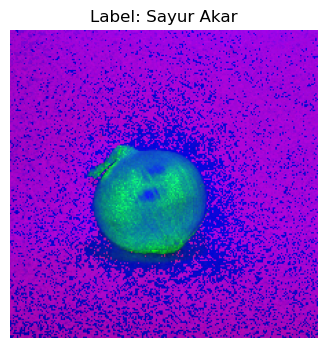

Shape	: (224, 224, 3)
Label	: Sayur Akar


In [24]:
img_viz(hsv_img, 0)

In [25]:
def preprocess_for_GLCM(processed_list):
    result = []
    for img, label in processed_list:
        grey = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
        result.append((grey, label))
    return result

In [26]:
glcm_img = preprocess_for_GLCM(aug)

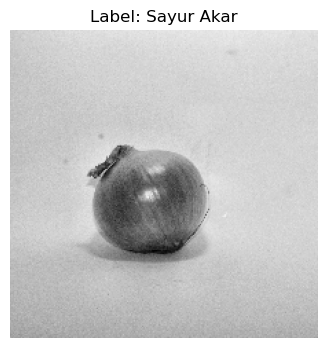

Shape	: (224, 224)
Label	: Sayur Akar


In [27]:
img_viz(glcm_img, 0)

## Hasil

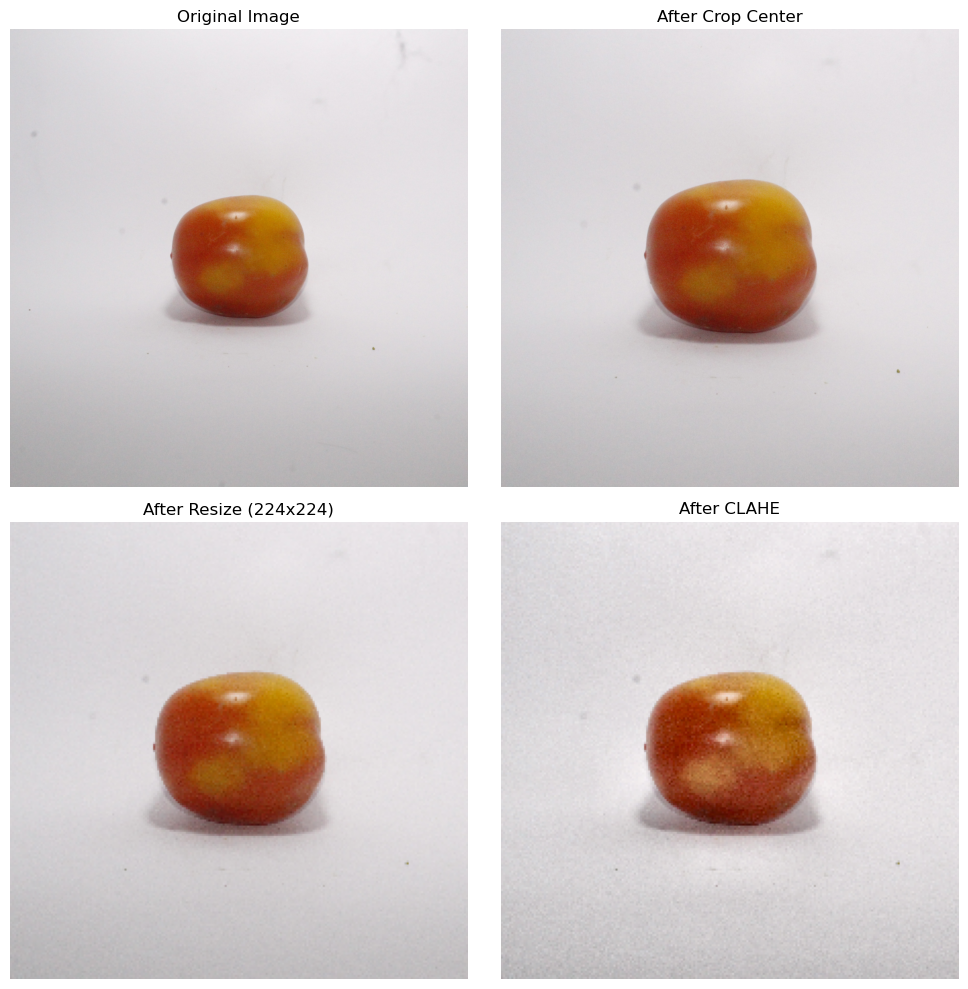

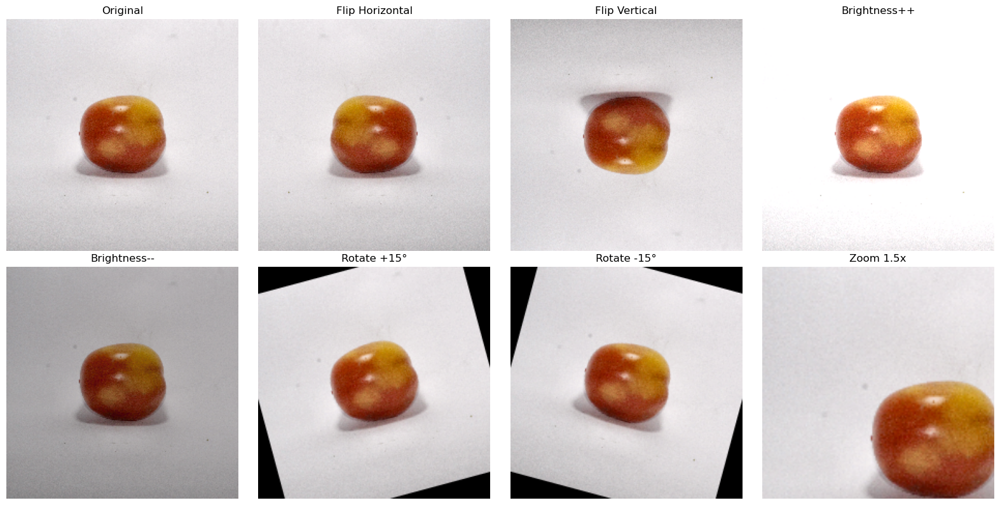

HOG Preprocessing:


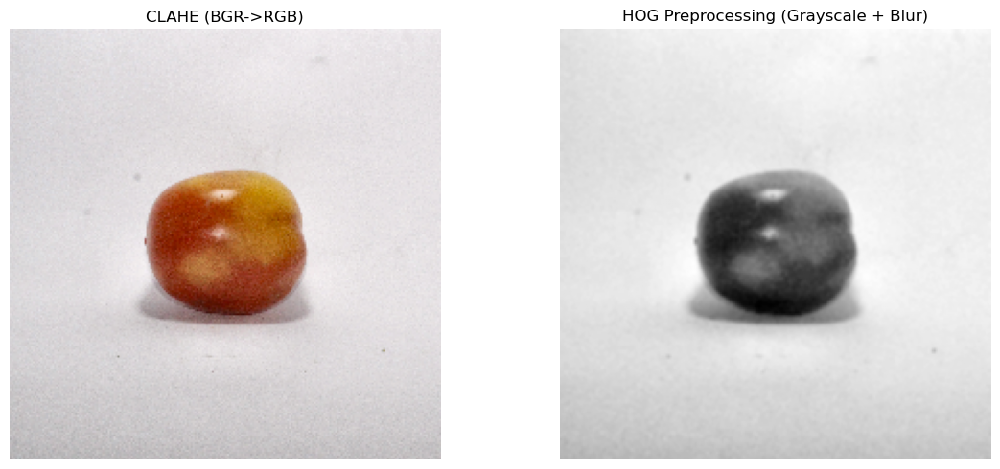


HSV Preprocessing:


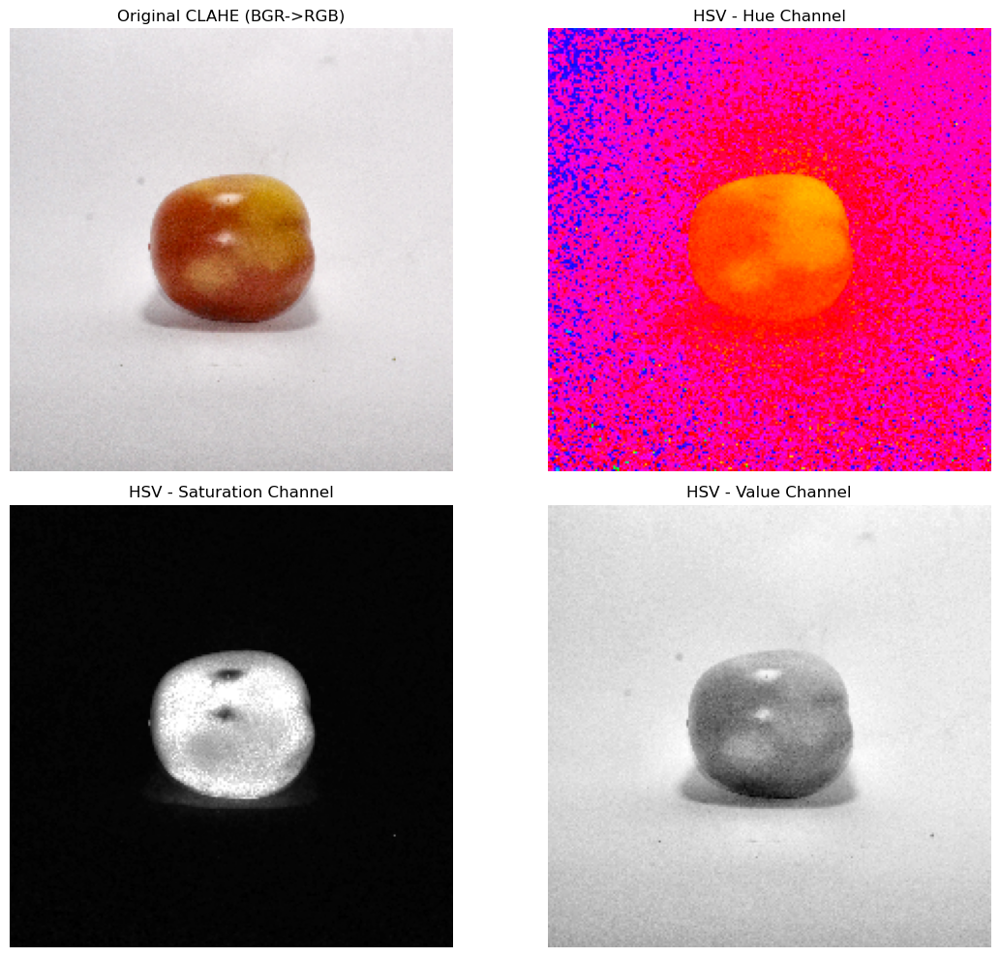


GLCM Preprocessing:


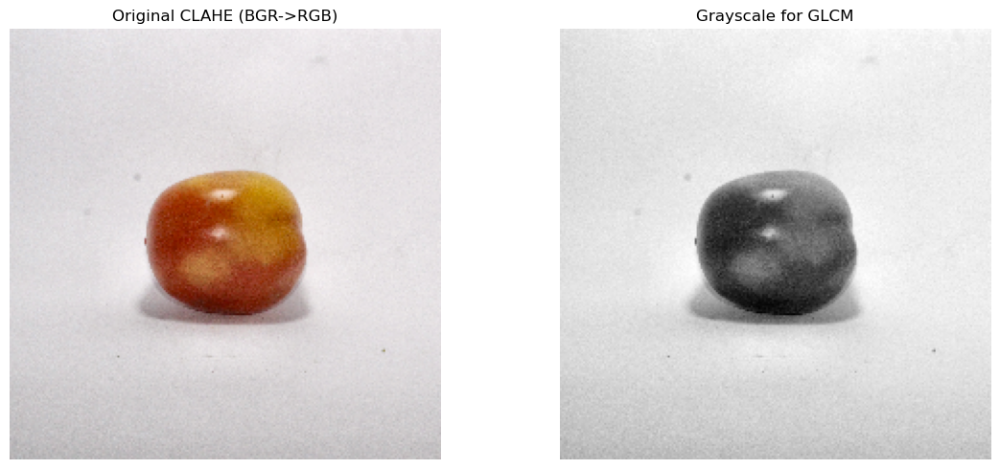

In [28]:
gambar = "dataset\Sayur Buah\_MG_0348.JPG"

# Load the original image
img_original = cv2.imread(gambar)
img_original = cv2.cvtColor(img_original, cv2.COLOR_BGR2RGB)

# Apply preprocessing functions
img_cropped = crop_center(img_original)
img_resized = cv2.resize(img_cropped, (224, 224))
img_clahe = apply_clahe(img_resized)

# Create figure with subplots for preprocessing steps
fig, axes = plt.subplots(2, 2, figsize=(10, 10))

# Original
axes[0, 0].imshow(img_original)
axes[0, 0].set_title('Original Image')
axes[0, 0].axis('off')

# Cropped
axes[0, 1].imshow(img_cropped)
axes[0, 1].set_title('After Crop Center')
axes[0, 1].axis('off')

# Resized
axes[1, 0].imshow(img_resized)
axes[1, 0].set_title('After Resize (224x224)')
axes[1, 0].axis('off')

# CLAHE
img_clahe_rgb = cv2.cvtColor(img_clahe, cv2.COLOR_BGR2RGB)
axes[1, 1].imshow(img_clahe_rgb)
axes[1, 1].set_title('After CLAHE')
axes[1, 1].axis('off')

plt.tight_layout()
plt.show()

# Apply augmentation
augmented_images = augment_img_deterministic(img_clahe)

# Visualize augmented images
titles = ['Original', 'Flip Horizontal', 'Flip Vertical', 'Brightness++', 
          'Brightness--', 'Rotate +15°', 'Rotate -15°', 'Zoom 1.5x']

fig, axes = plt.subplots(2, 4, figsize=(16, 8))
axes = axes.flatten()

for idx, aug_img in enumerate(augmented_images):
    aug_rgb = cv2.cvtColor(aug_img, cv2.COLOR_BGR2RGB)
    axes[idx].imshow(aug_rgb)
    axes[idx].set_title(titles[idx])
    axes[idx].axis('off')

plt.tight_layout()
plt.show()

# Fix: Create proper list of tuples
img_miaw = [(img_clahe, "Sayur Buah")]

# Preprocessing for different features
print("HOG Preprocessing:")
hog_img_result = preprocess_for_HOG(img_miaw)

fig, axes = plt.subplots(1, 2, figsize=(12, 5))
axes[0].imshow(img_clahe_rgb)
axes[0].set_title('CLAHE (BGR->RGB)')
axes[0].axis('off')

axes[1].imshow(hog_img_result[0][0], cmap='gray')  # Access the image from tuple
axes[1].set_title('HOG Preprocessing (Grayscale + Blur)')
axes[1].axis('off')

plt.tight_layout()
plt.show()

# HSV Preprocessing
print("\nHSV Preprocessing:")
hsv_img_result = preprocess_for_HSV(img_miaw)
hsv_img = hsv_img_result[0][0]  # Access the image from tuple

fig, axes = plt.subplots(2, 2, figsize=(12, 10))
axes[0, 0].imshow(img_clahe_rgb)
axes[0, 0].set_title('Original CLAHE (BGR->RGB)')
axes[0, 0].axis('off')

axes[0, 1].imshow(hsv_img[:, :, 0], cmap='hsv')
axes[0, 1].set_title('HSV - Hue Channel')
axes[0, 1].axis('off')

axes[1, 0].imshow(hsv_img[:, :, 1], cmap='gray')
axes[1, 0].set_title('HSV - Saturation Channel')
axes[1, 0].axis('off')

axes[1, 1].imshow(hsv_img[:, :, 2], cmap='gray')
axes[1, 1].set_title('HSV - Value Channel')
axes[1, 1].axis('off')

plt.tight_layout()
plt.show()

# GLCM Preprocessing
print("\nGLCM Preprocessing:")
glcm_img_result = preprocess_for_GLCM(img_miaw)
glcm_grey = glcm_img_result[0][0]  # Access the image from tuple

fig, axes = plt.subplots(1, 2, figsize=(12, 5))
axes[0].imshow(img_clahe_rgb)
axes[0].set_title('Original CLAHE (BGR->RGB)')
axes[0].axis('off')

axes[1].imshow(glcm_grey, cmap='gray')
axes[1].set_title('Grayscale for GLCM')
axes[1].axis('off')

plt.tight_layout()
plt.show()

In [29]:
from skimage.feature import graycomatrix, graycoprops
import numpy as np

def extract_GLCM(img_list):
    features = []

    distances = [1, 2]
    angles = [0, np.pi/4, np.pi/2, 3*np.pi/4]

    for img, label in img_list:
        glcm = graycomatrix(img, distances=distances, angles=angles, symmetric=True, normed=True)

        contrast = graycoprops(glcm, 'contrast').flatten()
        homogeneity = graycoprops(glcm, 'homogeneity').flatten()
        energy = graycoprops(glcm, 'energy').flatten()
        correlation = graycoprops(glcm, 'correlation').flatten()

        glcm_feat = np.hstack([contrast, homogeneity, energy, correlation])
        features.append((glcm_feat, label))

    return features


In [30]:
glcm_feat = extract_GLCM(glcm_img)

In [31]:
glcm_feat[0]

(array([7.40009809e+01, 9.37625731e+01, 7.46632567e+01, 7.75359649e+01,
        1.06468649e+02, 9.37625731e+01, 1.12458997e+02, 7.75359649e+01,
        1.95344310e-01, 1.89362249e-01, 1.93198137e-01, 1.85634676e-01,
        1.85907668e-01, 1.89362249e-01, 1.82671958e-01, 1.85634676e-01,
        3.57425051e-02, 3.51990235e-02, 3.53156944e-02, 3.42876867e-02,
        3.44175426e-02, 3.51990235e-02, 3.37484272e-02, 3.42876867e-02,
        9.67738484e-01, 9.59191706e-01, 9.67386586e-01, 9.66254044e-01,
        9.53754247e-01, 9.59191706e-01, 9.50965434e-01, 9.66254044e-01]),
 'Sayur Akar')

In [32]:
import numpy as np

def extract_HSV_hist(img_list, bins=(8, 8, 8)):
    features = []
    for img, label in img_list:

        hist = cv2.calcHist(
            [img],
            [0, 1, 2],    # H, S, V channel
            None,
            bins,
            [0, 180, 0, 256, 0, 256]
        )

        hist = cv2.normalize(hist, hist).flatten()
        features.append((hist, label))

    return features


In [37]:
hsv_feat = extract_HSV_hist(hsv_img)

In [38]:
hsv_feat

[(array([0.0000000e+00, 0.0000000e+00, 4.0346687e-05, 2.8242680e-04,
         4.1960557e-03, 7.9281241e-02, 2.7250153e-01, 2.3199346e-02,
         0.0000000e+00, 0.0000000e+00, 4.4381357e-04, 3.0663481e-03,
         9.8445918e-03, 5.0029894e-03, 2.3401079e-03, 1.4121340e-03,
         0.0000000e+00, 8.0693375e-05, 3.6312020e-04, 1.2104006e-03,
         4.5591756e-03, 9.2393914e-03, 1.1700539e-02, 2.0173343e-04,
         0.0000000e+00, 6.0520030e-04, 8.0693373e-04, 3.3891217e-03,
         1.8599823e-02, 2.1585478e-02, 4.8012557e-03, 0.0000000e+00,
         0.0000000e+00, 1.0893606e-03, 2.0576811e-03, 1.3838914e-02,
         4.2686794e-02, 8.8762715e-03, 1.6138675e-04, 0.0000000e+00,
         0.0000000e+00, 1.0490139e-03, 1.7752543e-03, 1.4403768e-02,
         2.1545131e-02, 6.0520030e-04, 0.0000000e+00, 0.0000000e+00,
         4.0346687e-05, 5.2450696e-04, 9.6832053e-04, 7.4237906e-03,
         4.9626427e-03, 0.0000000e+00, 0.0000000e+00, 0.0000000e+00,
         1.6138675e-04, 1.6138675e

In [39]:
from skimage.feature import hog

def extract_HOG(img_list):
    features = []
    for img, label in img_list:
        hog_feat = hog(
            img,
            orientations=9,
            pixels_per_cell=(8, 8),
            cells_per_block=(2, 2),
            block_norm='L2-Hys'
        )
        features.append((hog_feat, label))
    return features


In [40]:
hog_feat = extract_HOG(hog_img)

In [41]:
hog_feat

[(array([0.25681526, 0.09522721, 0.16464094, ..., 0.07304353, 0.09728225,
         0.06878894], shape=(26244,)),
  'Sayur Akar'),
 (array([0.23522535, 0.02488768, 0.23522535, ..., 0.22529418, 0.10189359,
         0.09964827], shape=(26244,)),
  'Sayur Akar'),
 (array([0.22529418, 0.1403208 , 0.13346707, ..., 0.23522535, 0.06501786,
         0.0351965 ], shape=(26244,)),
  'Sayur Akar'),
 (array([0.2645152 , 0.0798912 , 0.20211052, ..., 0.08393387, 0.06424678,
         0.12097272], shape=(26244,)),
  'Sayur Akar'),
 (array([0.2496932 , 0.07137244, 0.13823   , ..., 0.12075758, 0.03998834,
         0.05655205], shape=(26244,)),
  'Sayur Akar'),
 (array([0., 0., 0., ..., 0., 0., 0.], shape=(26244,)), 'Sayur Akar'),
 (array([0., 0., 0., ..., 0., 0., 0.], shape=(26244,)), 'Sayur Akar'),
 (array([0.25920267, 0.10419239, 0.14437376, ..., 0.14102099, 0.06372839,
         0.01183923], shape=(26244,)),
  'Sayur Akar'),
 (array([0.22734559, 0.05905523, 0.14379063, ..., 0.16945054, 0.23328013,
    

In [43]:
print(f"hog_feat shape: {len(hog_feat)} samples")
print(f"hog_feat[0][0] shape: {hog_feat[0][0].shape}")  # shape of feature vector

print(f"\nhsv_feat shape: {len(hsv_feat)} samples")
print(f"hsv_feat[0][0] shape: {hsv_feat[0][0].shape}")  # shape of feature vector

print(f"\nglcm_feat shape: {len(glcm_feat)} samples")
print(f"glcm_feat[0][0] shape: {glcm_feat[0][0].shape}")  # shape of feature vector


hog_feat shape: 1096 samples
hog_feat[0][0] shape: (26244,)

hsv_feat shape: 1096 samples
hsv_feat[0][0] shape: (512,)

glcm_feat shape: 1096 samples
glcm_feat[0][0] shape: (32,)


In [44]:
# Extract features and labels from each feature list
hog_features = np.array([feat[0] for feat in hog_feat])
hsv_features = np.array([feat[0] for feat in hsv_feat])
glcm_features = np.array([feat[0] for feat in glcm_feat])
labels = np.array([feat[1] for feat in hog_feat])

# Combine all features horizontally
combined_features = np.hstack([hog_features, hsv_features, glcm_features])

# Create dataframe
df_features = pd.DataFrame(combined_features)
df_features['label'] = labels

print(f"Combined dataframe shape: {df_features.shape}")
print(f"Total rows: {len(df_features)}")
print(f"Features columns: {combined_features.shape[1]}")
print(df_features.head())

Combined dataframe shape: (1096, 26789)
Total rows: 1096
Features columns: 26788
          0         1         2         3         4         5         6  \
0  0.256815  0.095227  0.164641  0.173432  0.131040  0.095976  0.093365   
1  0.235225  0.024888  0.235225  0.145056  0.235225  0.145056  0.235225   
2  0.225294  0.140321  0.133467  0.076339  0.225294  0.152689  0.225294   
3  0.264515  0.079891  0.202111  0.096437  0.264515  0.096437  0.126319   
4  0.249693  0.071372  0.138230  0.170973  0.195487  0.065957  0.103672   

          7         8         9  ...     26779     26780     26781     26782  \
0  0.103962  0.083122  0.256815  ...  0.034288  0.967738  0.959192  0.967387   
1  0.065018  0.035196  0.235225  ...  0.035199  0.967738  0.966254  0.967387   
2  0.101894  0.099648  0.225294  ...  0.035199  0.967738  0.966254  0.967387   
3  0.119837  0.056492  0.232235  ...  0.453818  0.970858  0.961744  0.970111   
4  0.136601  0.100752  0.249693  ...  0.042409  0.967793  0.959262  

In [45]:
X = df_features.drop('label', axis=1).values
y = df_features['label'].values

In [46]:
from sklearn.preprocessing import LabelEncoder
label_encoder = LabelEncoder()
y_encoded = label_encoder.fit_transform(y)

In [47]:
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(
    X, y_encoded, 
    test_size=0.2, 
    random_state=42, 
    stratify=y_encoded
)

In [48]:
from sklearn.preprocessing import StandardScaler
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

In [49]:
X_train_scaled

array([[ 0.5398772 , -0.60998377, -1.04933703, ...,  0.46254959,
         0.35484325,  0.49584227],
       [ 0.70296618,  0.4611255 ,  0.07598405, ...,  0.21389354,
         0.34343324,  0.22745436],
       [ 0.43915531, -0.74332436,  0.79960026, ..., -3.77020472,
        -1.79719533, -2.51705686],
       ...,
       [-1.54748979, -1.04631685, -1.15867677, ...,  0.76843063,
         0.67813021,  0.78748688],
       [ 0.54594265, -0.6284804 ,  1.39136804, ..., -0.51185135,
         0.83094168, -0.91102387],
       [-1.54748979, -1.04631685, -1.15867677, ...,  0.26317292,
         0.01771523,  0.17660295]], shape=(876, 26788))

## Metode SVM tanpa reduksi fitur

In [50]:
from sklearn.svm import SVC
from sklearn.model_selection import GridSearchCV

param_grid = {
    'C': [0.1, 1, 10, 100],
    'gamma': ['scale', 'auto', 0.001, 0.01, 0.1, 1],
    'kernel': ['rbf']
}


print("Parameter grid:")
for param, values in param_grid.items():
    print(f"  - {param}: {values}")

svm = SVC(random_state=42)
grid_search = GridSearchCV(
    svm, 
    param_grid, 
    cv=5, 
    scoring='accuracy', 
    n_jobs=-1, 
    verbose=2,
    return_train_score=True
)

grid_search.fit(X_train_scaled, y_train)

print("\n" + "="*70)
print("GRID SEARCH RESULTS")
print("="*70)
print(f"Best parameters: {grid_search.best_params_}")
print(f"Best cross-validation score: {grid_search.best_score_:.4f}")
print(f"Total combinations tested: {len(grid_search.cv_results_['params'])}")

best_model = grid_search.best_estimator_

cv_results = pd.DataFrame(grid_search.cv_results_)
top_5 = cv_results.nlargest(5, 'mean_test_score')[
    ['params', 'mean_test_score', 'std_test_score', 'rank_test_score']
]
print("\nTop 5 parameter combinations:")
print(top_5.to_string(index=False))

Parameter grid:
  - C: [0.1, 1, 10, 100]
  - gamma: ['scale', 'auto', 0.001, 0.01, 0.1, 1]
  - kernel: ['rbf']
Fitting 5 folds for each of 24 candidates, totalling 120 fits

GRID SEARCH RESULTS
Best parameters: {'C': 10, 'gamma': 'scale', 'kernel': 'rbf'}
Best cross-validation score: 0.9327
Total combinations tested: 24

Top 5 parameter combinations:
                                       params  mean_test_score  std_test_score  rank_test_score
 {'C': 10, 'gamma': 'scale', 'kernel': 'rbf'}         0.932656        0.006579                1
  {'C': 10, 'gamma': 'auto', 'kernel': 'rbf'}         0.932656        0.006579                1
{'C': 100, 'gamma': 'scale', 'kernel': 'rbf'}         0.932656        0.006579                1
 {'C': 100, 'gamma': 'auto', 'kernel': 'rbf'}         0.932656        0.006579                1
  {'C': 1, 'gamma': 'scale', 'kernel': 'rbf'}         0.916695        0.017001                5


In [51]:
from sklearn.metrics import classification_report
y_pred = best_model.predict(X_test_scaled)
print("\n" + "="*70)
print("CLASSIFICATION REPORT")
print("="*70)
print(classification_report(y_test, y_pred, target_names=label_encoder.classes_))


CLASSIFICATION REPORT
              precision    recall  f1-score   support

  Sayur Akar       0.98      0.95      0.96        58
  Sayur Buah       0.94      0.94      0.94        53
 Sayur Bunga       1.00      0.98      0.99        48
  Sayur Daun       0.94      0.98      0.96        61

    accuracy                           0.96       220
   macro avg       0.97      0.96      0.96       220
weighted avg       0.96      0.96      0.96       220



In [52]:
train_acc = best_model.score(X_train_scaled, y_train)
test_acc = best_model.score(X_test_scaled, y_test)
print("\n" + "="*70)
print("FINAL MODEL ACCURACY")
print("="*70)
print(f"Training Accuracy: {train_acc:.4f}")
print(f"Test Accuracy: {test_acc:.4f}")


FINAL MODEL ACCURACY
Training Accuracy: 1.0000
Test Accuracy: 0.9636


In [53]:
import joblib

joblib.dump(best_model, 'svm_kategori_sayur_model.joblib')

['svm_kategori_sayur_model.joblib']

## Metode KNN tanpa reduksi fitur

In [54]:
from sklearn.neighbors import KNeighborsClassifier

# =====================================
# KNN GRID SEARCH
# =====================================

knn_param_grid = {
    'n_neighbors': [3, 5, 7, 9, 11],
    'weights': ['uniform', 'distance'],
    'p': [1, 2],  # Manhattan(1) & Euclidean(2)
    'metric': ['minkowski']
}

print("Parameter grid (KNN):")
for param, values in knn_param_grid.items():
    print(f"  - {param}: {values}")

knn = KNeighborsClassifier()

knn_grid_search = GridSearchCV(
    knn,
    knn_param_grid,
    cv=5,
    scoring='accuracy',
    n_jobs=-1,
    verbose=2,
    return_train_score=True
)

knn_grid_search.fit(X_train_scaled, y_train)

print("\n" + "="*70)
print("KNN - GRID SEARCH RESULTS")
print("="*70)
print(f"Best parameters: {knn_grid_search.best_params_}")
print(f"Best cross-validation score: {knn_grid_search.best_score_:.4f}")
print(f"Total combinations tested: {len(knn_grid_search.cv_results_['params'])}")

knn_best_model = knn_grid_search.best_estimator_

knn_cv_results = pd.DataFrame(knn_grid_search.cv_results_)
knn_top_5 = knn_cv_results.nlargest(5, 'mean_test_score')[
    ['params', 'mean_test_score', 'std_test_score', 'rank_test_score']
]
print("\nTop 5 parameter combinations:")
print(knn_top_5.to_string(index=False))


Parameter grid (KNN):
  - n_neighbors: [3, 5, 7, 9, 11]
  - weights: ['uniform', 'distance']
  - p: [1, 2]
  - metric: ['minkowski']
Fitting 5 folds for each of 20 candidates, totalling 100 fits

KNN - GRID SEARCH RESULTS
Best parameters: {'metric': 'minkowski', 'n_neighbors': 3, 'p': 1, 'weights': 'distance'}
Best cross-validation score: 0.8664
Total combinations tested: 20

Top 5 parameter combinations:
                                                                  params  mean_test_score  std_test_score  rank_test_score
{'metric': 'minkowski', 'n_neighbors': 3, 'p': 1, 'weights': 'distance'}         0.866435        0.019682                1
{'metric': 'minkowski', 'n_neighbors': 3, 'p': 2, 'weights': 'distance'}         0.855039        0.010347                2
 {'metric': 'minkowski', 'n_neighbors': 3, 'p': 1, 'weights': 'uniform'}         0.843617        0.021181                3
 {'metric': 'minkowski', 'n_neighbors': 3, 'p': 2, 'weights': 'uniform'}         0.811669        0.

In [55]:
from sklearn.metrics import classification_report
y_pred = knn_best_model.predict(X_test_scaled)
print("\n" + "="*70)
print("CLASSIFICATION REPORT")
print("="*70)
print(classification_report(y_test, y_pred, target_names=label_encoder.classes_))


CLASSIFICATION REPORT
              precision    recall  f1-score   support

  Sayur Akar       0.93      0.93      0.93        58
  Sayur Buah       0.88      0.94      0.91        53
 Sayur Bunga       0.98      0.98      0.98        48
  Sayur Daun       1.00      0.93      0.97        61

    accuracy                           0.95       220
   macro avg       0.95      0.95      0.95       220
weighted avg       0.95      0.95      0.95       220



In [56]:
train_acc = knn_best_model.score(X_train_scaled, y_train)
test_acc = knn_best_model.score(X_test_scaled, y_test)
print("\n" + "="*70)
print("FINAL MODEL ACCURACY")
print("="*70)
print(f"Training Accuracy: {train_acc:.4f}")
print(f"Test Accuracy: {test_acc:.4f}")


FINAL MODEL ACCURACY
Training Accuracy: 1.0000
Test Accuracy: 0.9455


In [57]:
import joblib

joblib.dump(knn_best_model, 'knn_kategori_sayur_model.joblib')

['knn_kategori_sayur_model.joblib']

## Metode Random Forest tanpa reduksi fitur

In [58]:
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import GridSearchCV
import pandas as pd

# =====================================
# RANDOM FOREST GRID SEARCH
# =====================================

rf_param_grid = {
    'n_estimators': [100, 200, 300],
    'max_depth': [None, 10, 20, 30],
    'min_samples_split': [2, 5, 10],
    'min_samples_leaf': [1, 2, 4],
    'max_features': ['sqrt', 'log2']
}

print("Parameter grid (Random Forest):")
for param, values in rf_param_grid.items():
    print(f"  - {param}: {values}")

rf = RandomForestClassifier(random_state=42)

rf_grid_search = GridSearchCV(
    rf,
    rf_param_grid,
    cv=5,
    scoring='accuracy',
    n_jobs=-1,
    verbose=2,
    return_train_score=True
)

rf_grid_search.fit(X_train_scaled, y_train)

print("\n" + "="*70)
print("RANDOM FOREST - GRID SEARCH RESULTS")
print("="*70)
print(f"Best parameters: {rf_grid_search.best_params_}")
print(f"Best cross-validation score: {rf_grid_search.best_score_:.4f}")
print(f"Total combinations tested: {len(rf_grid_search.cv_results_['params'])}")

rf_best_model = rf_grid_search.best_estimator_

rf_cv_results = pd.DataFrame(rf_grid_search.cv_results_)
rf_top_5 = rf_cv_results.nlargest(5, 'mean_test_score')[
    ['params', 'mean_test_score', 'std_test_score', 'rank_test_score']
]
print("\nTop 5 parameter combinations:")
print(rf_top_5.to_string(index=False))


Parameter grid (Random Forest):
  - n_estimators: [100, 200, 300]
  - max_depth: [None, 10, 20, 30]
  - min_samples_split: [2, 5, 10]
  - min_samples_leaf: [1, 2, 4]
  - max_features: ['sqrt', 'log2']
Fitting 5 folds for each of 216 candidates, totalling 1080 fits

RANDOM FOREST - GRID SEARCH RESULTS
Best parameters: {'max_depth': None, 'max_features': 'sqrt', 'min_samples_leaf': 1, 'min_samples_split': 10, 'n_estimators': 300}
Best cross-validation score: 0.9943
Total combinations tested: 216

Top 5 parameter combinations:
                                                                                                          params  mean_test_score  std_test_score  rank_test_score
{'max_depth': None, 'max_features': 'sqrt', 'min_samples_leaf': 1, 'min_samples_split': 10, 'n_estimators': 300}         0.994292        0.003614                1
  {'max_depth': 20, 'max_features': 'sqrt', 'min_samples_leaf': 1, 'min_samples_split': 10, 'n_estimators': 300}         0.994292        0.00361

In [59]:
from sklearn.metrics import classification_report
y_pred = rf_best_model.predict(X_test_scaled)
print("\n" + "="*70)
print("CLASSIFICATION REPORT")
print("="*70)
print(classification_report(y_test, y_pred, target_names=label_encoder.classes_))


CLASSIFICATION REPORT
              precision    recall  f1-score   support

  Sayur Akar       1.00      1.00      1.00        58
  Sayur Buah       1.00      0.94      0.97        53
 Sayur Bunga       0.98      1.00      0.99        48
  Sayur Daun       0.97      1.00      0.98        61

    accuracy                           0.99       220
   macro avg       0.99      0.99      0.99       220
weighted avg       0.99      0.99      0.99       220



In [60]:
train_acc = rf_best_model.score(X_train_scaled, y_train)
test_acc = rf_best_model.score(X_test_scaled, y_test)
print("\n" + "="*70)
print("FINAL MODEL ACCURACY")
print("="*70)
print(f"Training Accuracy: {train_acc:.4f}")
print(f"Test Accuracy: {test_acc:.4f}")


FINAL MODEL ACCURACY
Training Accuracy: 1.0000
Test Accuracy: 0.9864


In [61]:
import joblib

joblib.dump(rf_best_model, 'rf_kategori_sayur_model.joblib')

['rf_kategori_sayur_model.joblib']

- menambah model yang lain
- memcoba reduksi dimensi